# EIP-7904 glue opcode dependency graph

#### Maria Silva, May 2026

We use the per-test glue opcode table produced by the EIP-7904 runtime estimation pipeline to build a directed dependency graph between EVM opcodes. The edge convention is: if opcode `A` is identified as a glue opcode for target opcode `B` in any benchmark test, then `B` depends on `A`, drawn as `B -> A`. The graph reveals which opcodes act as scaffolding for many target benchmarks (high in-degree as a glue) and which target benchmarks pull in the most scaffolding (high out-degree as a target).

The source data is [`glue_opcodes_by_test.csv`](../reports/eip-7904/runtime_estimation/2026-05-18_2026-05-20/glue_opcodes_by_test.csv) from the 2026-05-18/2026-05-20 EIP-7904 runtime estimation run.

In [21]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx

import warnings
warnings.filterwarnings("ignore")

In [22]:
sns.set_theme(
    style="whitegrid", palette="Set2", rc={"figure.dpi": 500, "axes.titlesize": 15}
)

current_path = os.getcwd()
repo_dir = os.path.abspath(os.path.join(current_path, ".."))
glue_csv = os.path.join(
    repo_dir,
    "reports",
    "eip-7904",
    "runtime_estimation",
    "2026-05-22_2026-05-26",
    "glue_opcodes_by_test.csv",
)

## Load data

Each row is a `(test_name, test_opcode, glue_opcode)` triple with the Pearson correlation between counts and the average per-target ratio. `test_opcode` is the target opcode of the benchmark; `glue_opcode` is a scaffolding opcode whose count scales with it.

In [23]:
df = pd.read_csv(glue_csv)
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   test_name    1000 non-null   object 
 1   test_opcode  1000 non-null   object 
 2   glue_opcode  1000 non-null   object 
 3   corr         1000 non-null   float64
 4   ratio        1000 non-null   float64
dtypes: float64(2), object(3)
memory usage: 39.2+ KB


,test_name,test_opcode,glue_opcode,corr,ratio
0,test_account_access,BALANCE,MSTORE8,1.0,2.617123
1,test_account_access,BALANCE,PC,1.0,1.000075
2,test_account_access,BALANCE,GT,1.0,10.468490
3,test_account_access,BALANCE,DIV,1.0,2.617123
4,test_account_access,BALANCE,PUSH20,1.0,2.617123


### Collapse opcode families

Several opcode families perform near-identically across their variants, so we collapse them to a single name before building the graph. This keeps the graph readable and avoids treating essentially-equivalent dependencies as distinct:

- `DUP1`, `DUP2`, ..., `DUP16` -> `DUP`
- `SWAP1`, `SWAP2`, ..., `SWAP16` -> `SWAP`
- `PUSHn` for `n` in 1..32 -> `PUSH` (`PUSH0` is kept separate because it does not pull bytes from the code immediate)

The collapse is applied to both the target opcode and the glue opcode columns. After renaming, multiple original rows can collapse to the same `(test_name, target, glue)` triple — for example, if both `DUP1` and `DUP3` were glue for the same target in the same test. We sum their `ratio` values (the per-target execution count of the family is the sum of the variants) and take the mean `corr` (correlations of the constituents).


In [24]:
import re

def collapse_opcode_family(op):
    """Collapse DUPn -> DUP, SWAPn -> SWAP, PUSHn (n>=1) -> PUSH. PUSH0 is kept."""
    if re.fullmatch(r"DUP\d+", op):
        return "DUP"
    if re.fullmatch(r"SWAP\d+", op):
        return "SWAP"
    if op == "PUSH0":
        return "PUSH0"
    if re.fullmatch(r"PUSH\d+", op):
        return "PUSH"
    return op

df["test_opcode"] = df["test_opcode"].map(collapse_opcode_family)
df["glue_opcode"] = df["glue_opcode"].map(collapse_opcode_family)

# After collapsing, multiple rows may share (test_name, test_opcode, glue_opcode).
# Sum the ratios (the family's per-target count is the sum of the variants) and
# average the correlations of the constituents.
df = (
    df.groupby(["test_name", "test_opcode", "glue_opcode"], as_index=False)
    .agg(corr=("corr", "mean"), ratio=("ratio", "sum"))
)
print(f"Rows after collapse: {len(df)}")
df.head()

Rows after collapse: 638


,test_name,test_opcode,glue_opcode,corr,ratio
0,test_account_access,BALANCE,AND,1.0,2.616725
1,test_account_access,BALANCE,DIV,1.0,2.617123
2,test_account_access,BALANCE,EXP,1.0,5.234245
3,test_account_access,BALANCE,GT,1.0,10.468490
4,test_account_access,BALANCE,ISZERO,1.0,7.851368


### Exclude `STATICCALL` in `test_account_access`

The `test_account_access` benchmark uses `STATICCALL` as part of its scaffolding rather than as a clean target, which makes the `STATICCALL` row from this test inject many spurious dependencies into the graph (it is the main source of the large strongly-connected component). We drop it here so the downstream graph reflects only meaningful target-glue relationships.


In [25]:
mask = (df["test_name"] == "test_account_access") & (df["test_opcode"] == "STATICCALL")
print(f"Dropping {mask.sum()} rows where test_name=test_account_access and test_opcode=STATICCALL")
df = df[~mask].reset_index(drop=True)
print(f"Rows after filter: {len(df)}")

Dropping 15 rows where test_name=test_account_access and test_opcode=STATICCALL
Rows after filter: 623


### Exclude `test_storage_access_cold_benchmark`, `test_storage_access_warm_benchmark` and `test_create`

In [26]:
excluded_tests = [
    "test_storage_access_cold_benchmark",
    "test_storage_access_warm_benchmark",
    "test_create"
]
mask = df["test_name"].isin(excluded_tests)
print(f"Dropping {mask.sum()} rows from {excluded_tests}")
df = df[~mask].reset_index(drop=True)
print(f"Rows after filter: {len(df)}")

Dropping 41 rows from ['test_storage_access_cold_benchmark', 'test_storage_access_warm_benchmark', 'test_create']
Rows after filter: 582


In [27]:
n_tests = df["test_name"].nunique()
n_targets = df["test_opcode"].nunique()
n_glue = df["glue_opcode"].nunique()
print(f"Tests:           {n_tests}")
print(f"Target opcodes:  {n_targets}")
print(f"Glue opcodes:    {n_glue}")
print(f"Triples:         {len(df)}")

Tests:           53
Target opcodes:  93
Glue opcodes:    30
Triples:         582


## Build the global dependency graph

We aggregate across all tests: for any `(target, glue)` pair seen in any test, we add a directed edge `target -> glue` (target depends on glue). Edge attributes summarise how often the dependency was observed and the strength of the underlying signal:

- `n_tests`: number of tests where the dependency was observed,
- `mean_ratio`: average per-target execution count of the glue opcode (averaged across tests),
- `max_ratio`: maximum per-target ratio across tests,
- `mean_corr`: mean Pearson correlation across tests.

Self-loops are dropped (a target can never be a glue for itself by construction, but we drop them defensively).

In [28]:
edge_df = (
    df[df["test_opcode"] != df["glue_opcode"]]
    .groupby(["test_opcode", "glue_opcode"], as_index=False)
    .agg(
        n_tests=("test_name", "nunique"),
        mean_ratio=("ratio", "mean"),
        max_ratio=("ratio", "max"),
        mean_corr=("corr", "mean"),
    )
    .rename(columns={"test_opcode": "target", "glue_opcode": "glue"})
)
edge_df = edge_df.sort_values(["target", "mean_ratio"], ascending=[True, False]).reset_index(drop=True)
print(f"Edges in the global graph: {len(edge_df)}")
edge_df.head(10)

Edges in the global graph: 533


,target,glue,n_tests,mean_ratio,max_ratio,mean_corr
0,ADD,DUP,1,1.000123,1.000123,1.0
1,ADDMOD,DUP,2,1.500138,2.000276,1.0
2,ADDMOD,PUSH,1,1.003016,1.003016,1.0
3,ADDMOD,CALLDATALOAD,1,0.001502,0.001502,1.0
4,ADDMOD,JUMPDEST,1,0.001502,0.001502,1.0
5,ADDMOD,JUMP,1,0.001501,0.001501,1.0
6,ADDMOD,POP,1,0.001501,0.001501,1.0
7,ADDRESS,PUSH0,1,0.002931,0.002931,1.0
8,ADDRESS,CALLDATASIZE,1,0.000977,0.000977,1.0
9,ADDRESS,GAS,1,0.000977,0.000977,1.0


In [29]:
G = nx.DiGraph()
for _, row in edge_df.iterrows():
    G.add_edge(
        row["target"],
        row["glue"],
        n_tests=int(row["n_tests"]),
        mean_ratio=float(row["mean_ratio"]),
        max_ratio=float(row["max_ratio"]),
        mean_corr=float(row["mean_corr"]),
    )
print(f"Nodes: {G.number_of_nodes()}")
print(f"Edges: {G.number_of_edges()}")
print(f"Has cycles: {not nx.is_directed_acyclic_graph(G)}")

Nodes: 98
Edges: 533
Has cycles: True


## Graph topology stats

For each opcode we compute:

- **out-degree**: number of distinct opcodes this opcode depends on (as a target).
- **in-degree**: number of distinct target opcodes that depend on this opcode (as a glue).

An opcode with high in-degree is a *universal glue* — scaffolding pulled in by many benchmarks. An opcode with high out-degree is a *heavy target* — its benchmark requires lots of scaffolding.

In [30]:
degree_df = pd.DataFrame(
    {
        "opcode": list(G.nodes()),
        "out_degree": [G.out_degree(n) for n in G.nodes()],
        "in_degree": [G.in_degree(n) for n in G.nodes()],
    }
)
degree_df["is_target"] = degree_df["opcode"].isin(df["test_opcode"].unique())
degree_df["is_glue"] = degree_df["opcode"].isin(df["glue_opcode"].unique())
degree_df = degree_df.sort_values(["in_degree", "out_degree"], ascending=False).reset_index(drop=True)
degree_df.head(20)

,opcode,out_degree,in_degree,is_target,is_glue
0,PUSH,5,58,True,True
1,POP,0,55,False,True
2,GAS,5,46,True,True
3,CALLDATASIZE,5,41,True,True
4,STATICCALL,4,41,True,True
5,DUP,6,35,True,True
6,PUSH0,5,35,True,True
7,JUMPDEST,0,28,False,True
8,PC,6,26,True,True
9,GT,1,24,True,True


In [31]:
leaves = degree_df[(degree_df["out_degree"] == 0) & (degree_df["in_degree"] > 0)]["opcode"].tolist()
roots = degree_df[(degree_df["in_degree"] == 0) & (degree_df["out_degree"] > 0)]["opcode"].tolist()
print(f"Pure glue (sink, never a target): {len(leaves)}")
print(sorted(leaves))
print()
print(f"Pure target (source, never glue): {len(roots)}")
print(sorted(roots))

Pure glue (sink, never a target): 5
['ISZERO', 'JUMPDEST', 'POP', 'STOP', 'SWAP']

Pure target (source, never glue): 68
['ADDMOD', 'ADDRESS', 'BALANCE', 'BASEFEE', 'BLAKE2F', 'BLOBBASEFEE', 'BLOCKHASH', 'BLS12_G1ADD', 'BLS12_G1MSM', 'BLS12_G2ADD', 'BLS12_G2MSM', 'BLS12_MAP_FP2_TO_G2', 'BLS12_MAP_FP_TO_G1', 'BLS12_PAIRING_CHECK', 'BYTE', 'CALL', 'CALLCODE', 'CALLER', 'CALLVALUE', 'CHAINID', 'CODECOPY', 'CODESIZE', 'COINBASE', 'DELEGATECALL', 'ECADD', 'ECMUL', 'ECPAIRING', 'ECRECOVER', 'EQ', 'EXTCODECOPY', 'EXTCODEHASH', 'EXTCODESIZE', 'GASLIMIT', 'GASPRICE', 'IDENTITY', 'LOG0', 'LOG1', 'LOG2', 'LOG3', 'LOG4', 'MCOPY', 'MOD', 'MODEXP', 'MSIZE', 'MULMOD', 'NUMBER', 'OR', 'ORIGIN', 'P256VERIFY', 'POINT_EVALUATION', 'PREVRANDAO', 'RETURNDATACOPY', 'RIPEMD-160', 'SAR', 'SDIV', 'SGT', 'SHA2-256', 'SHL', 'SHR', 'SIGNEXTEND', 'SLOAD', 'SLT', 'SMOD', 'SSTORE', 'TIMESTAMP', 'TLOAD', 'TSTORE', 'XOR']


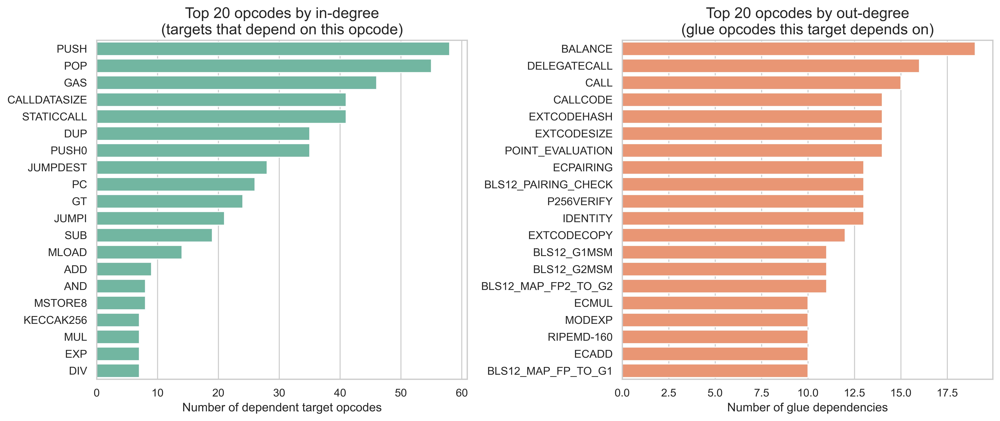

In [32]:
top_in = degree_df.sort_values("in_degree", ascending=False).head(20)
top_out = degree_df.sort_values("out_degree", ascending=False).head(20)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.barplot(data=top_in, y="opcode", x="in_degree", ax=axes[0], color="#66c2a5")
axes[0].set_title("Top 20 opcodes by in-degree\n(targets that depend on this opcode)")
axes[0].set_xlabel("Number of dependent target opcodes")
axes[0].set_ylabel("")

sns.barplot(data=top_out, y="opcode", x="out_degree", ax=axes[1], color="#fc8d62")
axes[1].set_title("Top 20 opcodes by out-degree\n(glue opcodes this target depends on)")
axes[1].set_xlabel("Number of glue dependencies")
axes[1].set_ylabel("")
plt.tight_layout()
plt.show()

### Cycles in the dependency graph

A cycle `B -> A -> ... -> B` means a set of opcodes mutually pull each other in as scaffolding across the benchmark suite — for example, target `B`'s benchmark uses `A` as glue, and target `A`'s benchmark uses `B` as glue. Cycles indicate that the dependency relation cannot be flattened into a layered hierarchy: the families involved must be estimated jointly.

We first identify the strongly-connected components (SCCs) of size > 1 — only nodes inside such SCCs can take part in a cycle — and then enumerate all elementary cycles inside each non-trivial SCC using `networkx.simple_cycles`.


In [33]:
sccs = [c for c in nx.strongly_connected_components(G) if len(c) > 1]
print(f"Non-trivial strongly-connected components: {len(sccs)}")
for i, c in enumerate(sccs):
    print(f"  SCC {i} (size {len(c)}): {sorted(c)}")

Non-trivial strongly-connected components: 1
  SCC 0 (size 7): ['CALLDATASIZE', 'DUP', 'GAS', 'MLOAD', 'PUSH', 'PUSH0', 'STATICCALL']


In [34]:
cycles = list(nx.simple_cycles(G))
cycles.sort(key=lambda c: (len(c), c))
print(f"Total elementary cycles: {len(cycles)}")

cycles_df = pd.DataFrame(
    [
        {
            "length": len(c),
            "cycle": " -> ".join(list(c) + [c[0]]),
        }
        for c in cycles
    ]
)
print()
print("Cycle length distribution:")
print(cycles_df["length"].value_counts().sort_index())

Total elementary cycles: 117

Cycle length distribution:
length
2     8
3    15
4    22
5    24
6    24
7    24
Name: count, dtype: int64


**How often each opcode appears in some cycle.** Opcodes near the top of this list are the hardest to estimate independently — their runtime is entangled with the runtimes of the other opcodes they cycle with.

In [35]:
from collections import Counter

node_cycle_count = Counter(n for cyc in cycles for n in cyc)
node_cycle_df = (
    pd.DataFrame(
        node_cycle_count.most_common(),
        columns=["opcode", "n_cycles"],
    )
)
node_cycle_df

,opcode,n_cycles
0,STATICCALL,97
1,GAS,91
2,PUSH,91
3,CALLDATASIZE,86
4,PUSH0,86
5,DUP,65
6,MLOAD,65


**External glue dependencies of opcodes in cycles.** For each opcode that participates in at least one cycle, we list its glue dependencies that lie *outside* the cyclic set. These external dependencies form a topological prefix below the cyclic core: their runtimes can be estimated independently of the cycle and then plugged into the joint estimation for the entangled opcodes.

In [36]:
cyclic_nodes = set(n for cyc in cycles for n in cyc)
print(f"Opcodes participating in at least one cycle: {len(cyclic_nodes)}")
print(sorted(cyclic_nodes))
print()
for op in sorted(cyclic_nodes):
    external_glue = [g for g in G.successors(op) if g not in cyclic_nodes]
    external_glue.sort()
    print(f"  {op:14s} -> {external_glue if external_glue else '(none)'}")

Opcodes participating in at least one cycle: 7
['CALLDATASIZE', 'DUP', 'GAS', 'MLOAD', 'PUSH', 'PUSH0', 'STATICCALL']

  CALLDATASIZE   -> ['POP']
  DUP            -> ['POP']
  GAS            -> ['POP']
  MLOAD          -> ['POP']
  PUSH           -> ['POP']
  PUSH0          -> ['POP']
  STATICCALL     -> ['POP']


### Mixed opcodes (acyclic, both target and glue)

Beyond the 5 pure glues and the 7 cyclic opcodes, there is a third group: opcodes that appear *both* as benchmark targets and as glues for other benchmarks, but that lie outside any cycle. For these to be estimable in a layered way, their own glue dependencies must resolve into the cyclic core, the pure-glue set, or other mixed opcodes — never escaping into the pure-target tier. (An escape into a pure target would be impossible by construction, since pure targets have in-degree zero, but we check explicitly.) The mixed subgraph itself also needs to be acyclic so a topological estimation order exists.

If these conditions hold, mixed opcodes can be estimated *after* the pure glues and the cyclic core: for each one, fit a per-test regression with the already-known glue contribution subtracted, in topological order so each opcode's mixed glue partners are estimated before it.

In [37]:
pure_glue_set = set(leaves)
mixed_opcodes = sorted(
    [
        n
        for n in G.nodes()
        if G.in_degree(n) > 0 and G.out_degree(n) > 0 and n not in cyclic_nodes
    ]
)
print(f"Mixed opcodes (acyclic, both glue and target): {len(mixed_opcodes)}")
print(mixed_opcodes)
print()

print("Per-opcode glue dependencies of mixed opcodes:")
escapes = []
for op in mixed_opcodes:
    succ = sorted(G.successors(op))
    bad = [
        s
        for s in succ
        if s not in cyclic_nodes and s not in pure_glue_set and s not in mixed_opcodes
    ]
    print(f"  {op:12s} -> {succ}")
    if bad:
        escapes.append((op, bad))

print()
print(
    f"Mixed opcodes with glues outside (cycle ∪ pure-glue ∪ mixed): {len(escapes)}"
)
mixed_subgraph = G.subgraph(mixed_opcodes)
print(f"Mixed subgraph is a DAG: {nx.is_directed_acyclic_graph(mixed_subgraph)}")
print(
    f"Topological estimation order within mixed: {list(nx.topological_sort(mixed_subgraph))}"
)

Mixed opcodes (acyclic, both glue and target): 18
['ADD', 'AND', 'CALLDATACOPY', 'CALLDATALOAD', 'DIV', 'EXP', 'GT', 'JUMP', 'JUMPI', 'KECCAK256', 'LT', 'MSTORE', 'MSTORE8', 'MUL', 'PC', 'RETURNDATASIZE', 'SELFBALANCE', 'SUB']

Per-opcode glue dependencies of mixed opcodes:
  ADD          -> ['DUP']
  AND          -> ['DUP']
  CALLDATACOPY -> ['CALLDATASIZE', 'PUSH']
  CALLDATALOAD -> ['JUMPDEST', 'PUSH0']
  DIV          -> ['DUP']
  EXP          -> ['DUP']
  GT           -> ['DUP']
  JUMP         -> ['ADD', 'JUMPDEST', 'PC', 'PUSH']
  JUMPI        -> ['PUSH0']
  KECCAK256    -> ['MSTORE', 'PUSH0']
  LT           -> ['DUP']
  MSTORE       -> ['DUP']
  MSTORE8      -> ['DUP']
  MUL          -> ['DUP']
  PC           -> ['CALLDATASIZE', 'GAS', 'POP', 'PUSH', 'PUSH0', 'STATICCALL']
  RETURNDATASIZE -> ['POP']
  SELFBALANCE  -> ['CALLDATASIZE', 'GAS', 'POP', 'PUSH', 'PUSH0', 'STATICCALL']
  SUB          -> ['DUP']

Mixed opcodes with glues outside (cycle ∪ pure-glue ∪ mixed): 0
Mixed subgr

## Network visualization

We draw the directed graph with nodes positioned by spring layout, edges thicker when the underlying mean ratio is higher, and nodes coloured by their role:

- target-only opcodes (red): only appear as benchmark targets
- glue-only opcodes (green): only appear as scaffolding
- mixed opcodes (blue): act as both target and glue in different tests

Node size scales with total degree (in + out).

In [38]:
def node_role(node, df_):
    is_t = node in df_["test_opcode"].values
    is_g = node in df_["glue_opcode"].values
    if is_t and is_g:
        return "mixed"
    if is_t:
        return "target_only"
    return "glue_only"

role_color = {"target_only": "#e78ac3", "glue_only": "#66c2a5", "mixed": "#8da0cb"}

node_roles = {n: node_role(n, df) for n in G.nodes()}
node_colors = [role_color[node_roles[n]] for n in G.nodes()]
node_sizes = [80 + 25 * (G.in_degree(n) + G.out_degree(n)) for n in G.nodes()]
edge_weights = [0.4 + 0.05 * min(d["mean_ratio"], 20) for _, _, d in G.edges(data=True)]

plt.figure(figsize=(18, 18))
pos = nx.spring_layout(G, k=1.8, seed=42, iterations=200)
nx.draw_networkx_edges(
    G,
    pos,
    width=edge_weights,
    alpha=0.35,
    arrows=True,
    arrowsize=8,
    edge_color="#444444",
    connectionstyle="arc3,rad=0.05",
)
nx.draw_networkx_nodes(
    G, pos, node_color=node_colors, node_size=node_sizes, edgecolors="black", linewidths=0.4
)
nx.draw_networkx_labels(G, pos, font_size=6)

legend_handles = [
    plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=10, label=role)
    for role, c in role_color.items()
]
plt.legend(handles=legend_handles, loc="upper right", fontsize=10)
plt.title("Global glue opcode dependency graph (target -> glue)\nEIP-7904 runtime estimation, 2026-05-18 to 2026-05-20")
plt.axis("off")
plt.tight_layout()
plt.show()

## Dependency matrix heatmap

The matrix has targets on the rows and glue opcodes on the columns. Cell `(B, A)` is shaded by the mean per-target ratio of glue `A` for target `B` (averaged across tests where the dependency appears). Empty cells indicate no detected dependency. The log scale is used because ratios span several orders of magnitude.

Rows and columns are ordered by total marginal frequency so that the densest portion of the matrix is in the top-left corner.

In [39]:
matrix = edge_df.pivot_table(
    index="target", columns="glue", values="mean_ratio", aggfunc="mean"
)
row_order = matrix.notna().sum(axis=1).sort_values(ascending=False).index
col_order = matrix.notna().sum(axis=0).sort_values(ascending=False).index
matrix = matrix.loc[row_order, col_order]
matrix.shape

(93, 30)

In [40]:
log_matrix = np.log10(matrix.where(matrix > 0))

plt.figure(figsize=(16, 22))
sns.heatmap(
    log_matrix,
    cmap="viridis",
    cbar_kws={"label": r"$\log_{10}$(mean ratio of glue executions per target)"},
    linewidths=0.1,
    linecolor="#eeeeee",
    square=False,
)
plt.title("Dependency matrix: target opcode (row) depends on glue opcode (column)")
plt.xlabel("Glue opcode (A)")
plt.ylabel("Target opcode (B)")
plt.tight_layout()
plt.show()

# Takeaways

The opcodes split into four groups, which together suggest a layered estimation strategy where each group can be fit once the groups above it are done:

1. **5 pure glues** (`ISZERO`, `JUMPDEST`, `POP`, `STOP`, `SWAP`): they are never benchmark targets themselves, so they have no glue dependencies. Estimate each with its own single-opcode regression.
2. **7 cyclic opcodes** (`CALLDATASIZE`, `DUP`, `GAS`, `MLOAD`, `PUSH`, `PUSH0`, `STATICCALL`): they are mutually entangled — each acts as both glue and target for the others. Estimate them with a single joint multivariate regression of the form `runtime = const + p_1 * count_1 + ... + p_7 * count_7`. Their only out-of-cycle glue is `POP`, which is already estimated from group 1.
3. **18 mixed opcodes**: they appear both as targets and as glues, but their subgraph is acyclic, and the verification cell above confirms that all their glue dependencies lie in `cycle ∪ pure-glue ∪ mixed`. Fit a per-test regression for each, subtracting the already-known glue contribution from groups 1 and 2, and process them in topological order within this group so each opcode's mixed glue partners are estimated before it. The mixed group itself splits in two:
    - **16 mixed opcodes whose glues are entirely in groups 1–2** (pure glue + cyclic): `ADD`, `AND`, `CALLDATACOPY`, `CALLDATALOAD`, `DIV`, `EXP`, `GT`, `JUMPI`, `LT`, `MSTORE`, `MSTORE8`, `MUL`, `PC`, `RETURNDATASIZE`, `SELFBALANCE`, `SUB`. These can be fit immediately after group 2 in any order.
    - **2 mixed opcodes that also depend on other mixed opcodes** (must be ordered topologically within group 3): `JUMP` (depends on `ADD`, `PC`) and `KECCAK256` (depends on `MSTORE`).
4. **The remaining pure-target opcodes** (never a glue themselves): fit per-test individually and subtract the glue adjustment estimated from groups 1–3.

This four-tier ordering is what allows pure targets to see meaningful glue corrections for opcodes like `PC`, `JUMPI`, `GT`, and `SUB`, which act as glues in tests like `test_alt_bn128_uncachable` even though they are not in the original "pure glue" set.